# Setup

In [1]:
import os
import io
import requests
import json
import time
import matplotlib.pyplot as plt
import itertools
from itertools import product
from random import random

## necessary to install
import numpy as np
import networkx as nx
import pandas as pd
import seaborn as sns
from scipy.stats import bernoulli
from scipy.stats import multivariate_normal
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

## Config Vars

In [2]:
PLAYLIST_SAMPLE_SIZE = 500
ART_MIN_PLAY_THRES = 5
DEFAULT_ITERATIONS = 100

SPOTIFY_JSON_PATH = "../data/"
SPOTIFY_JSON_NAME = "spotify_artists_master.json"

### In hindsight, everything in this section should have been split out amongst the other sections...oops

# Data Prep

### Define Stat Functions

In [92]:
def update_print_unique_lists(df, old_playlists_list, old_artists_list):
    old_playlists_list.clear()
    old_artists_list.clear()
    old_playlists_list[:] = df['playlistname'].unique()[:]
    old_artists_list[:] = df['artistname'].unique()[:]
    print('Number of Playlists:', len(old_playlists_list))
    print('Number of Artists:', len(old_artists_list))

In [96]:
def artists_stats_per_playlist(df):
    stats = df.groupby('playlistname')["artistname"].describe()
    stats.columns = ["count", "unique", "top", "top_deg"]
    stats = stats.astype({"count": 'int', "unique": 'int', "top_deg": 'int'})
    return stats

In [ ]:
def box_whiskers_artists_per_playlist(stats):
    

In [5]:
#X axis isnt what i want it to be...
def plot_artists_per_playlist(df, save_dir = None):
    df_grouped = df.groupby('playlistname').agg({'artistname': 'nunique'})

    df_grouped.plot(kind="bar", figsize=(15,9)).get_xaxis().set_visible(False)
    plt.xlabel('Playlists')
    plt.ylabel('Number of Artists')
    plt.title('Number of Artists per Playlist')

    if save_dir:
        plt.savefig(save_dir)

    plt.show()

## Run Through

In [6]:
raw_playlists_list = []
raw_artist_list = []

df = pd.read_csv('../data/spotify_dataset.csv', usecols=range(4), lineterminator='\n', header=0)
df.columns = [x.replace('"', '').lstrip() for x in df.columns]

In [7]:
df

,user_id,artistname,trackname,playlistname
0,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello,(The Angels Wanna Wear My) Red Shoes,HARD ROCK 2010
1,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello & The Attractions,"(What's So Funny 'Bout) Peace, Love And Unders...",HARD ROCK 2010
2,9cc0cfd4d7d7885102480dd99e7a90d6,Tiffany Page,7 Years Too Late,HARD ROCK 2010
3,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello & The Attractions,Accidents Will Happen,HARD ROCK 2010
4,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello,Alison,HARD ROCK 2010
...,...,...,...,...
12901974,2302bf9c64dc63d88a750215ed187f2c,Mötley Crüe,Wild Side,iPhone
12901975,2302bf9c64dc63d88a750215ed187f2c,John Lennon,Woman,iPhone
12901976,2302bf9c64dc63d88a750215ed187f2c,Tom Petty,You Don't Know How It Feels,iPhone
12901977,2302bf9c64dc63d88a750215ed187f2c,Tom Petty,You Wreck Me,iPhone


In [8]:
update_print_unique_lists(df, raw_playlists_list, raw_artist_list)

Number of Playlists: 161530
Number of Artists: 290002


In [9]:
print("Removing number of rows based on NAs:")
display(df.isna().sum())
df = df.dropna()

Removing number of rows based on NAs:


user_id             0
artistname      33568
trackname          85
playlistname     1253
dtype: int64

In [10]:
print_artists_stats_per_playlist(df)
update_print_unique_lists(df, raw_playlists_list, raw_artist_list)

,count,unique,top,freq
playlistname,,,,
,46,39,Ben Howard,3
waves,37,1,The Wave Pictures,37
11,115,91,Old 97's,5
Frida,23,6,Elliot Goldenthal,16
New tunes 05/11,24,20,Feldberg,3
...,...,...,...,...
🚇,86,9,Seapony,13
🚘🚜🚀,39,30,Joaquin Sabina,3
🚙,10,8,alt-J,3


count     79.749171
unique    22.421234
freq      19.967535
dtype: float64

Number of Playlists: 161345
Number of Artists: 289784


In [11]:
%%time
#THIS MAY TAKE A VERY VERY VERY LONG TIME, MAYBE SKIP
#plot_artists_per_playlist(df)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 12.9 µs


In [12]:
# Removes any artist that only appears in a single playlist (for entire raw DS)
playlists_per_artist = df.groupby("artistname").playlistname.nunique()
playlists_per_artist = playlists_per_artist[playlists_per_artist > 1]
playlists_per_artist_keys = playlists_per_artist.keys()
df = df[df["artistname"].isin(playlists_per_artist_keys)]

In [13]:
### Previous Tests for filtering artists on entire DS
## art_filt_t1 - simply removes any artist that appears a single time on the entire tabular ds
# art_filt_t1 = df.artistname.value_counts()
# display(art_filt_t1)
# display(art_filt_t1[art_filt_t1 > 1])
## art_filt_t2 - groups ds by artist, then removes any artist that only appears on a single playlist (removes more!!)
# art_filt_t2 = df.groupby("artistname").playlistname.nunique().sort_values(ascending=False)
# display(art_filt_t2)
# display(art_filt_t2[art_filt_t2 > 1])

In [14]:
%%time
print_artists_stats_per_playlist(df)
update_print_unique_lists(df, raw_playlists_list, raw_artist_list)

,count,unique,top,freq
playlistname,,,,
,45,38,Ben Howard,3
waves,37,1,The Wave Pictures,37
11,114,90,Old 97's,5
Frida,23,6,Elliot Goldenthal,16
New tunes 05/11,24,20,Feldberg,3
...,...,...,...,...
🚇,86,9,Seapony,13
🚘🚜🚀,39,30,Joaquin Sabina,3
🚙,10,8,alt-J,3


count     79.038557
unique    21.881042
freq      20.042529
dtype: float64

Number of Playlists: 158880
Number of Artists: 148690


In [15]:
%%time
#THIS MAY TAKE A VERY VERY VERY LONG TIME, MAYBE SKIP
#plot_artists_per_playlist(df)

CPU times: user 1 µs, sys: 1 µs, total: 2 µs
Wall time: 3.1 µs


In [16]:
# TODO
# SPLIT ARTISTS BY [COMMAS, amphersands, featuring (ft.)] FOR LISTS

# some songs have two artists, they cannot (and should not) be displayed together!!! Must split, take into account when creating edges

## Should it effect the weights?? I think it should, as similar artists would make songs together...I think?
## Ooh maybe make OHE if artists collaborate?? Not sure what that would yield tbh

In [17]:
df.loc[df['artistname'].str.contains("Royce Da", na = False)]

,user_id,artistname,trackname,playlistname
4004949,9fdd8a9dbdfab564c8bec32f1ebfb953,Pretty Ugly & Royce Da 5'9,Spit Game,All da shitz from 2013
4008120,9fdd8a9dbdfab564c8bec32f1ebfb953,Pretty Ugly & Royce Da 5'9,Spit Game,New Playlist
4634186,fa849dabeb14a2800ad5130907fc5018,"Royce Da 5'9"",Beamer",Benz,"Or Bentley (ShadyMegaMix)"""
4814830,c48f64453d55d9071ea00f105fe5a231,Afu-Ra Featuring Royce Da 5'9,Pusha,Let me talk
4815012,c48f64453d55d9071ea00f105fe5a231,Afu-Ra Featuring Royce Da 5'9,Pusha,New Playlist 3
4815473,c48f64453d55d9071ea00f105fe5a231,Afu-Ra Featuring Royce Da 5'9,Pusha,soul/hiphop for papi chulo
5940474,b14d2e898cdfdb83adb555c3a00c8801,"Royce Da 5'9"",Beamer",Benz,or Bentley (ShadyMegaMix) [feat. Slaughterhou...
7506146,711f90a8c6e22ce8b04065376eb71d7e,Pretty Ugly & Royce Da 5'9,Spit Game,The Music of GTA
7536260,3cfeb4a26363301934c17c9fadac3bfa,Pretty Ugly & Royce Da 5'9,Spit Game,EVERYTHING
7536883,3cfeb4a26363301934c17c9fadac3bfa,Pretty Ugly & Royce Da 5'9,Spit Game,Going In


In [18]:
# Similar artists merging?
# Elvis Costello
# Elvis Costello & The Attractions
# Royce Da 5'9",Part Of Me"
# Royce Da 5'9",Part Of Me (Street)"

### Current Initialized Lists/Dicts:

In [19]:
raw_playlists_list, raw_artist_list

(['HARD ROCK 2010',
  'IOW 2012',
  '2080',
  'C418',
  'Chill out',
  'Classique',
  'Daft Punk ',
  'Electro',
  'Ghibli songs',
  'Soirée',
  'Starred',
  'Work playlist',
  '2014 beginning ',
  'Chelsea',
  'Disney..',
  'Gracious',
  'HATK',
  'JOOTDR',
  'MD',
  'WIHA',
  'frozen ',
  'summer 2012',
  'Fluff',
  'Gillat från Radio',
  'håkaan <3',
  'ngt emo eller',
  "tove's spamlista (okok)",
  'Electrooo ',
  '/"',
  'Annat',
  'April 2014',
  'August 2014',
  'Bored out of my mind, someone please get me out of this town. ',
  'Complications you could do without',
  'Cool, like Eskimo chicks on Discovery Channel',
  'December 2013',
  'E.',
  'Ecuador',
  'Everything at once',
  'February 2014',
  'February 2015',
  'Golden Oldies',
  'Home is never far away',
  'Ibland vill man bara glömma, trots att det blivit ditt liv nu. ',
  'J.',
  'January 2014',
  'January 2015',
  'July 2014',
  'June 2014',
  'March 2014',
  'March 2015',
  'May 2014',
  'May 2015',
  'Money makes th

In [20]:
playlists_per_artist

artistname
 Dolce                           4
!!!                            386
!Dela Dap                       35
!Distain                         2
!Tang                            2
                              ... 
일렉트로보이즈                          6
장기하와 얼굴들 Kiha & The Faces        2
지오 [MBLAQ]                       3
ª„Ω≈Ô≈’                         2
￾䴀愀爀漀漀渀 㔀 昀攀愀琀⸀ 圀椀稀 䬀栀愀氀椀昀愀      2
Name: playlistname, Length: 148690, dtype: int64

## Stats?

# Sampling

In [21]:
np.random.seed(0)
sample_playlists = np.random.choice(raw_playlists_list, PLAYLIST_SAMPLE_SIZE, replace=False)
sampled_df = df[df['playlistname'].isin(sample_playlists)]
main_playlists = []
main_artists = []

In [98]:
stats = artists_stats_per_playlist(sampled_df)
display(stats)
update_print_unique_lists(sampled_df, main_playlists, main_artists)
print('Number of songs in sample:', len(sampled_df))

,count,unique,top,top_deg
playlistname,,,,
# DJ,46,5,David Guetta,30
#28,3,3,Hot Chip,1
#RavensNation,9,9,The Script,1
+ Liked from Radio,177,79,Coldplay,13
100 remixes 1980's,5,5,Aretha Franklin,1
...,...,...,...,...
to 12 with love,2,2,Nickelback,1
whiny country music,7,4,The Civil Wars,3
workout music ckw,9,8,Ellie Goulding,2


Number of Playlists: 171
Number of Artists: 284
Number of songs in sample: 5925


<AxesSubplot:>

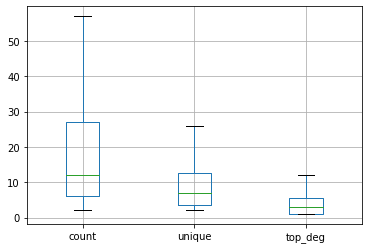

In [99]:
pd.DataFrame.boxplot(stats, showfliers=False)

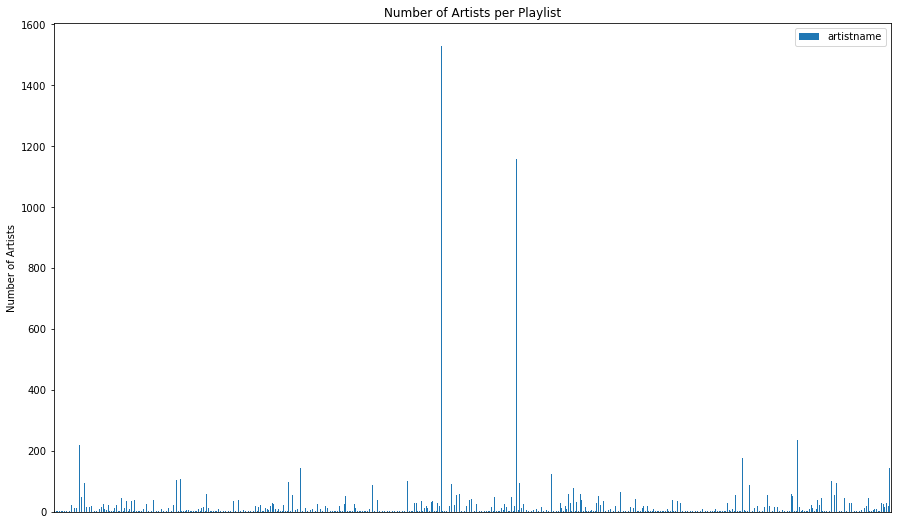

CPU times: user 799 ms, sys: 72.7 ms, total: 872 ms
Wall time: 713 ms


In [23]:
%%time
plot_artists_per_playlist(sampled_df)

In [24]:
appearances = sampled_df.groupby('artistname').agg({'trackname':'count', 'playlistname':'nunique'})
appearances.sort_values(by=['trackname', 'playlistname'])

,trackname,playlistname
artistname,,
!Dela Dap,1,1
#1 Hits Now,1,1
10 Years,1,1
10LEC6,1,1
2 Pac,1,1
...,...,...
Venetian Snares,220,1
David Guetta,269,21
John Williams,271,3


In [25]:
main_artists = list(appearances[appearances['playlistname']>=ART_MIN_PLAY_THRES].index)
print('# of artists that appear on at least {} playlists within the sample:'.format(ART_MIN_PLAY_THRES), len(main_artists))

# of artists that appear on at least 5 playlists within the sample: 284


In [26]:
thres_artists_df = sampled_df[sampled_df['artistname'].isin(main_artists)]
thres_artists_grouped_df = thres_artists_df.groupby('playlistname').agg({'artistname':lambda x: len(x.unique())})

# Because we removed some artists, double check to confirm there is no artist by themselves again (with no playlist connected to anybody) 
main_playlists = list(thres_artists_grouped_df[thres_artists_grouped_df['artistname'] > 1].index)
sampled_df = thres_artists_df[thres_artists_df['playlistname'].isin(main_playlists)]
sampled_df

,user_id,artistname,trackname,playlistname
18995,9fb60017f2d971b03885ba80748b19bd,Robbie Williams,Angels,PRIMERA
18996,9fb60017f2d971b03885ba80748b19bd,Robbie Williams,Angels - Live at Knebworth,PRIMERA
19016,9fb60017f2d971b03885ba80748b19bd,Robbie Williams,Feel,PRIMERA
19023,9fb60017f2d971b03885ba80748b19bd,Imagine Dragons,It's Time,PRIMERA
19034,9fb60017f2d971b03885ba80748b19bd,Corinne Bailey Rae,One Night Of Sin - Live At Tipitina's,PRIMERA
...,...,...,...,...
12897815,bf7fd0e14a76a1945d1bd0cce485fd26,The Temper Trap,Sweet Disposition,PopShit
12897817,bf7fd0e14a76a1945d1bd0cce485fd26,Band of Horses,The Funeral,PopShit
12897822,bf7fd0e14a76a1945d1bd0cce485fd26,CHVRCHES,We Sink,PopShit
12897825,bf7fd0e14a76a1945d1bd0cce485fd26,The Naked And Famous,Young Blood,PopShit


# !!! #

In [27]:
print_artists_stats_per_playlist(sampled_df)
update_print_unique_lists(sampled_df, main_playlists, main_artists)

,count,unique,top,freq
playlistname,,,,
# DJ,46,5,David Guetta,30
#28,3,3,Hot Chip,1
#RavensNation,9,9,The Script,1
+ Liked from Radio,177,79,Coldplay,13
100 remixes 1980's,5,5,Aretha Franklin,1
...,...,...,...,...
to 12 with love,2,2,Nickelback,1
whiny country music,7,4,The Civil Wars,3
workout music ckw,9,8,Ellie Goulding,2


count     34.649123
unique    12.046784
freq       7.280702
dtype: float64

Number of Playlists: 171
Number of Artists: 284


# NOTE WE HAVE LESS THAN HALF THE PLAYLISTS THAN WE INITIALLY PUT AS OUR SAMPLE SIZE 
## And this is after I removed outlier artist nodes before sampling playlists, either lower threshold or increase playlists

# !!! # 

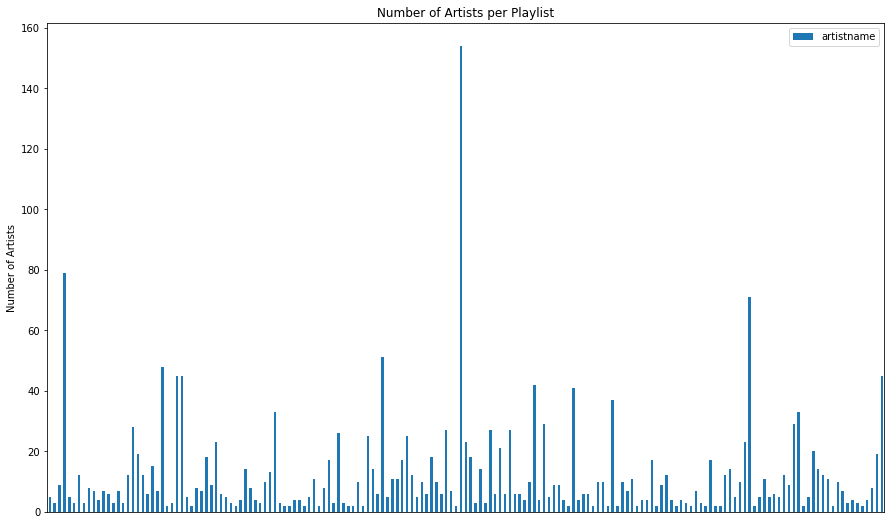

CPU times: user 465 ms, sys: 35.4 ms, total: 501 ms
Wall time: 206 ms


In [28]:
%%time
plot_artists_per_playlist(sampled_df)

# Graph Generation Initialization

### Functions

In [29]:
# same def as quarter 1
def read_edge(gph, n0, n1):
    if gph.has_edge(n0, n1):
        gph[n0][n1]['weight'] +=1
        return gph[n0][n1]['weight']
    else:
        gph.add_edge(n0, n1, weight=1)
        return 1

In [30]:
#help(nx.layout)
def plot_network(
    G,
    node_color='#1f78b4',
    node_border_color = None,
    node_alpha = 0.9,
    edge_alpha = 0.2,
    labels_dict = None,
    labels_size = 16,
    labels_color=None,
    save_dir = None
):
    fig = plt.figure(1, figsize=(56, 41), dpi=90)
    position = nx.kamada_kawai_layout(G) # I like this laylout, and gephi doesnt seem to have it, will look into
    nx.draw_networkx_nodes(G, position, node_size=2000, node_color=node_color, linewidths=3, edgecolors=node_border_color, alpha=node_alpha)
    nx.draw_networkx_edges(G, position, width=1.5, alpha=edge_alpha, node_size = 2000)
    nx.draw_networkx_labels(G, position, labels = labels_dict, font_size = labels_size, font_color=labels_color)    
    
    if save_dir:
        plt.savefig(save_dir)
        
    plt.show()

In [31]:
label_lambda = lambda x: x if (len(x) <= 8) or (len(x.split()) == 1) else x.split()[0][0] + ". " + x.split()[-1]

### Run Through

In [32]:
sampled_df_grouped = sampled_df.groupby('playlistname').agg({'artistname': lambda x: (x).unique()})

In [33]:
G = nx.Graph()
# if not unique, could weight the number of times the artist appears in that playlist
heighest_edge_weight = 0
for i in range(len(sampled_df_grouped)):
    for a in (sampled_df_grouped.iloc[i]):
        for a1, a2 in itertools.combinations(a, 2):
            curr_weight = read_edge(G, a1, a2)
            if curr_weight > heighest_edge_weight: 
                heighest_edge_weight = curr_weight

In [34]:
print("highest edge weight: {}".format(heighest_edge_weight))

highest edge weight: 12


In [35]:
artist_degree_dict = dict(G.degree(G.nodes()))
artists_by_degree = [x[0] for x in sorted(artist_degree_dict.items(), key=lambda x: x[1], reverse=True)]
artist_degree_dict

{'deadmau5': 219,
 'David Guetta': 248,
 'Snoop Dogg': 194,
 'Avicii': 241,
 'Daft Punk': 258,
 'Hot Chip': 212,
 'Zero 7': 169,
 'Janelle Monáe': 119,
 'The Script': 213,
 'Nelly': 200,
 'Eminem': 128,
 'JAY Z': 240,
 'Jimi Hendrix': 108,
 'The White Stripes': 116,
 'Blur': 194,
 'Wiz Khalifa': 67,
 'U2': 222,
 'Madonna': 223,
 'Lorde': 191,
 'Coldplay': 270,
 'DJ Khaled': 150,
 'M.I.A.': 238,
 'Skrillex': 100,
 'Ellie Goulding': 217,
 'Metric': 211,
 'The Cure': 216,
 'Lana Del Rey': 211,
 'Sia': 240,
 'Macklemore & Ryan Lewis': 161,
 'New Order': 213,
 'Oasis': 210,
 'Snow Patrol': 223,
 'Adele': 220,
 'John Mayer': 233,
 'Sleigh Bells': 225,
 'Kanye West': 254,
 'Of Monsters and Men': 159,
 'Florence + The Machine': 189,
 'The Civil Wars': 107,
 'Alicia Keys': 150,
 'Ed Sheeran': 222,
 'Kygo': 134,
 'Icona Pop': 178,
 'Fleetwood Mac': 208,
 'Sara Bareilles': 217,
 'Jack Johnson': 214,
 'Bruno Mars': 207,
 'Washed Out': 150,
 'CHVRCHES': 157,
 'Beyoncé': 251,
 'Birdy': 124,
 'My Che

In [36]:
nx.number_connected_components(G)

1

In [37]:
nx.center(G)

['deadmau5',
 'David Guetta',
 'Snoop Dogg',
 'Avicii',
 'Daft Punk',
 'Hot Chip',
 'Zero 7',
 'Janelle Monáe',
 'The Script',
 'Nelly',
 'Eminem',
 'JAY Z',
 'Jimi Hendrix',
 'The White Stripes',
 'Blur',
 'Wiz Khalifa',
 'U2',
 'Madonna',
 'Lorde',
 'Coldplay',
 'DJ Khaled',
 'M.I.A.',
 'Skrillex',
 'Ellie Goulding',
 'Metric',
 'The Cure',
 'Lana Del Rey',
 'Sia',
 'Macklemore & Ryan Lewis',
 'New Order',
 'Oasis',
 'Snow Patrol',
 'Adele',
 'John Mayer',
 'Sleigh Bells',
 'Kanye West',
 'Of Monsters and Men',
 'Florence + The Machine',
 'The Civil Wars',
 'Alicia Keys',
 'Ed Sheeran',
 'Kygo',
 'Icona Pop',
 'Fleetwood Mac',
 'Sara Bareilles',
 'Jack Johnson',
 'Bruno Mars',
 'Washed Out',
 'CHVRCHES',
 'Beyoncé',
 'Birdy',
 'My Chemical Romance',
 'David Bowie',
 'Ray LaMontagne',
 'OneRepublic',
 'blink-182',
 'Bon Jovi',
 'Imagine Dragons',
 'Ben Howard',
 'Bob Dylan',
 'Sam Smith',
 'Justin Timberlake',
 'Jason Mraz',
 'M83',
 'The Killers',
 'Blackstreet',
 'Crystal Castles',


In [38]:
i = 0
good_i = [6, 25, 43, 73]

# essientally degree/total num of nodes
#sorted(nx.degree_centrality(G).items(), key=lambda x:x[1], reverse=True)

In [39]:
labels_dict = {x: label_lambda(x) for x in main_artists}
labels_dict

{'Robbie Williams': 'R. Williams',
 'Imagine Dragons': 'I. Dragons',
 'Corinne Bailey Rae': 'C. Rae',
 'Bruce Springsteen': 'B. Springsteen',
 'Band of Horses': 'B. Horses',
 'DJ Shadow': 'D. Shadow',
 'Portishead': 'Portishead',
 'Lil Wayne': 'L. Wayne',
 'OutKast': 'OutKast',
 'Kanye West': 'K. West',
 'M.I.A.': 'M.I.A.',
 'JAY Z': 'JAY Z',
 'Robin Thicke': 'R. Thicke',
 'Robyn': 'Robyn',
 'Macklemore & Ryan Lewis': 'M. Lewis',
 'blink-182': 'blink-182',
 'A Tribe Called Quest': 'A. Quest',
 'Grimes': 'Grimes',
 'Daft Punk': 'D. Punk',
 'Snoop Dogg': 'S. Dogg',
 'Icona Pop': 'I. Pop',
 'Ne-Yo': 'Ne-Yo',
 'Blackstreet': 'Blackstreet',
 'Hot Chip': 'Hot Chip',
 'Gotye': 'Gotye',
 'Ace of Base': 'A. Base',
 'Matchbox Twenty': 'M. Twenty',
 'Everclear': 'Everclear',
 'The Goo Goo Dolls': 'T. Dolls',
 'Rihanna': 'Rihanna',
 'Pearl Jam': 'P. Jam',
 'Stevie Wonder': 'S. Wonder',
 'Jack Johnson': 'J. Johnson',
 'David Gray': 'D. Gray',
 'The Roots': 'T. Roots',
 'Chromeo': 'Chromeo',
 'The W

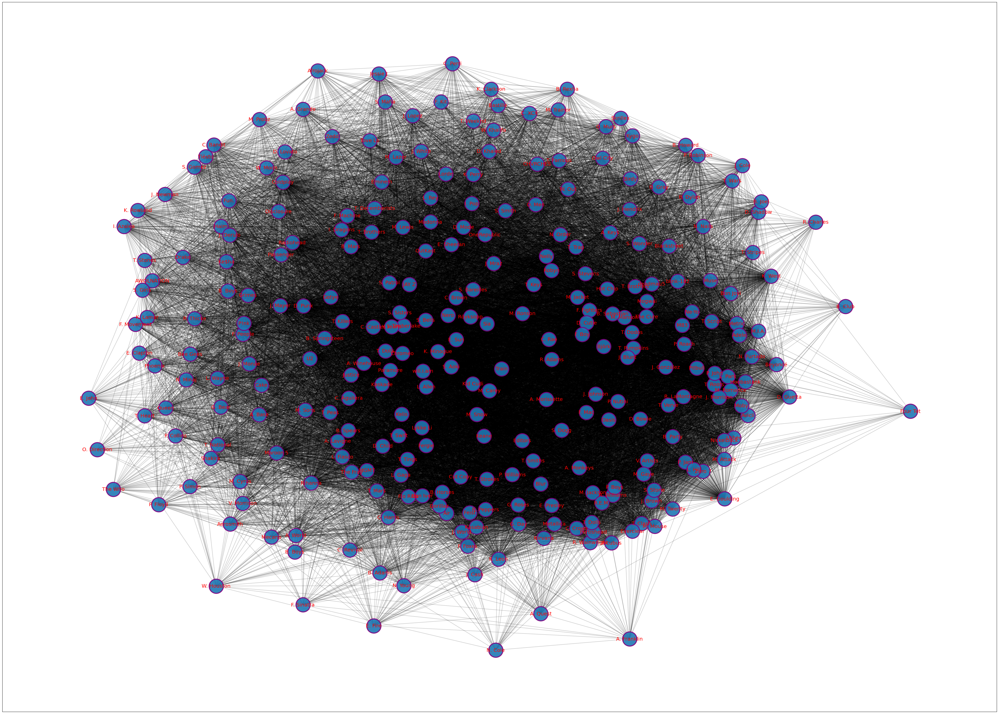

CPU times: user 10.7 s, sys: 287 ms, total: 11 s
Wall time: 11.1 s


In [40]:
%%time
# PLOTS AND SAVES
# colors are just an example
save_direct = "../data/sampled_network.png"
plot_network(G, node_border_color = "purple", labels_dict = labels_dict, labels_color="red", save_dir = save_direct)

In [41]:
heighest_edge_weight

12

# Spotify Algo Stuff

In [42]:
def save_spotify_master_dict(dictionary, json_path, json_name):
    try:
        json.dump(dictionary, open(json_path+json_name,"w"))
        print("{} saved in {}".format(json_name, json_path))
    except:
        print("Error saving {}".format(json_path+json_name))
    
def load_spotify_master_dict(json_path, json_name):
    fp = json_path + json_name
    # check if file exists
    if os.path.isfile(fp):
        print ("Loading {}!".format(fp))
    else:
        print ("{} does not exist, creating file!".format(fp))
        save_spotify_master_dict(json_path, json_name)
            
    spotify_master_dict = json.load(open(fp,"r"))
    return spotify_master_dict






def helper_get_spotipy_client():
    client_id = '8ac5bd4f29854a4abb37648a5b7833d8'
    client_secret = 'c9f1281a0f774d97ae7d002139e53049'
    client_credentials_manager = SpotifyClientCredentials(client_id, client_secret)
    sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)    
    return sp
def helper_search_spotify_artist(sp, artist, spotify_master_dict):
    """ Requires sp from get_spotipy_client"""
    
    result = sp.search(artist, type='artist')['artists']['items']
    spotify_master_dict[artist] = result
    return result

def update_master_dictionary(artist_names, spotify_master_dict):
    """ Requires spotify_master_dict from load_spotify_master_dict"""
    sp = helper_get_spotipy_client()
    
    for artist in artist_names:
        if artist in spotify_master_dict:
#             print("{} already searched from Spotify!".format(artist))
            continue
        else:
            helper_search_spotify_artist(sp, artist, spotify_master_dict)
            
            if len(spotify_master_dict[artist]) > 0:
                print("Found match for {}".format(artist))
            else:
                print("No match found match for {}".format(artist))
                #Because we have a threshold of 5 artists, this really shouldnt pop up

    return spotify_master_dict




def filter_first_results(dictionary):
    """ Requires spotify_master_dict from load_spotify_master_dict.
    Recommended to run update_master_dictionary after to properly load
    already downloaded artists and get new ones """
    return {k: v[0] for (k,v) in dictionary.items()}

def get_artist_genres(filtered_dict):
    """ Requires first results only dictionary of spotify_master_dict made from filter_first_results"""
    return {k: v["genres"] for (k,v) in filtered_dict.items()}

def helper_melt_genres(art_gen_dict):
    return pd.Series(sum(list(spotify_artist_genres.values()), []))
def get_total_genre_counts(art_gen_dict):
    """ Requires dictionary only with genres made from get_artist_genres"""
    melted_series = helper_melt_genres(art_gen_dict)
    return melted_series.value_counts()

## Runthrough
#### what would essentially go in run.py 

In [43]:
main_spotify_dict = load_spotify_master_dict(SPOTIFY_JSON_PATH, SPOTIFY_JSON_NAME)
update_master_dictionary(main_artists, main_spotify_dict)
save_spotify_master_dict(main_spotify_dict, SPOTIFY_JSON_PATH, SPOTIFY_JSON_NAME)

first_result_spotify_master = filter_first_results(main_spotify_dict)
spotify_artist_genres = get_artist_genres(first_result_spotify_master)
genre_counts = get_total_genre_counts(spotify_artist_genres)

Loading ../data/spotify_artists_master.json!
spotify_artists_master.json saved in ../data/


## Spotify Stats Functions

#### Maybe Figure out how to label + add in median and mean for these, or like computing the threshold with the graphs

In [44]:
foll = pd.Series([v["followers"]["total"] for (k, v) in first_result_spotify_master.items() if v["followers"]["total"] > 1])

<AxesSubplot:ylabel='Frequency'>

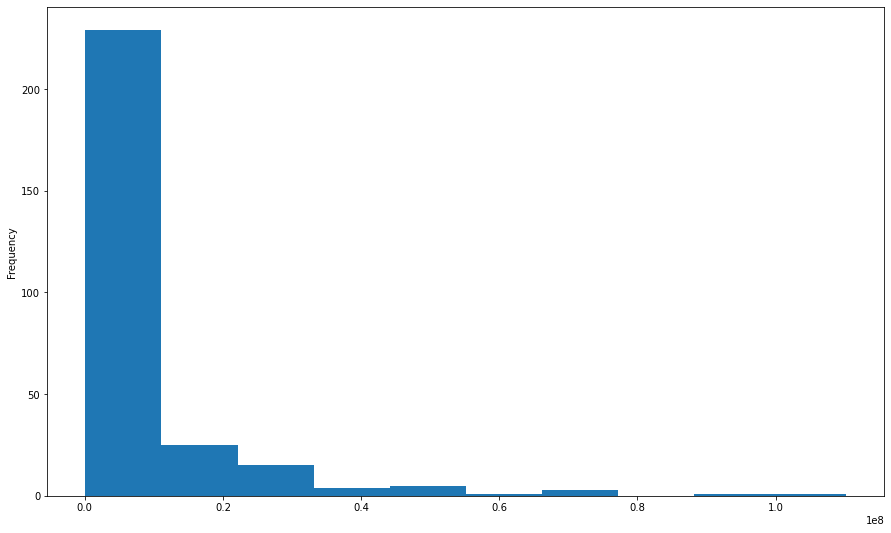

In [45]:
pd.Series([v["followers"]["total"] for (k, v) in first_result_spotify_master.items() if v["followers"]["total"] > 1]).plot(kind="hist", figsize=(15, 9))

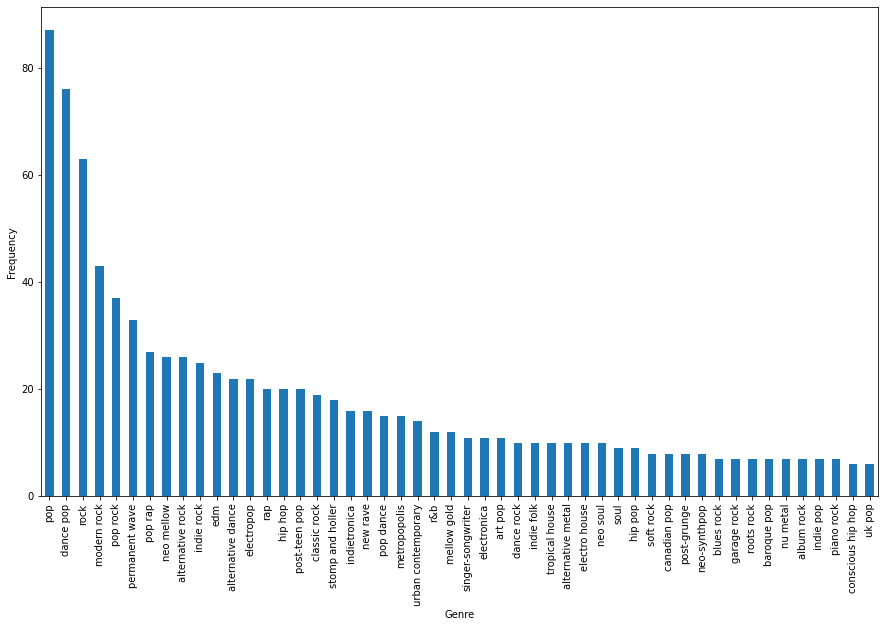

In [46]:
def plot_genres(genre_counts, save_dir=None):
    genre_counts[:50].plot(kind='bar', figsize=(15, 9))
    plt.xlabel("Genre")
    plt.ylabel("Frequency")
    
    if save_dir:
        plt.savefig(save_dir)
    plt.show()
    
plot_genres(genre_counts, "../data/spotify_artists_total_genre_counts.png")

# Could get labels for Communities based off top X genres that dont have overlapping words
# Could also sum up all genres +subgenres that have that word, then take top X of that
# Or could do it post by looking at top artist genres after splitting community

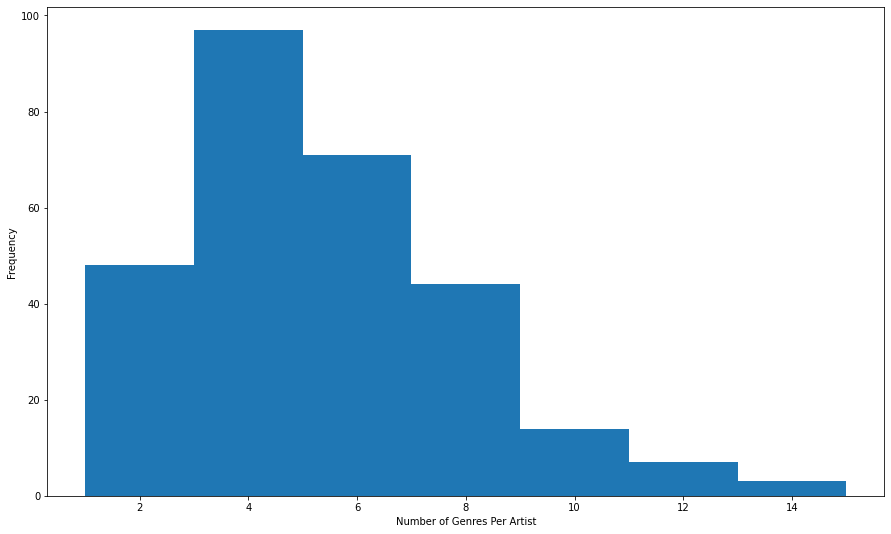

In [47]:
def plot_genres_per_artist(art_gen_dict, save_dir=None):
    num_genres_per_artist = {k: len(v) for (k, v) in art_gen_dict.items()}
    pd.Series(num_genres_per_artist).plot(kind='hist', figsize=(15, 9), bins=7)
    plt.xlabel("Number of Genres Per Artist")
    plt.ylabel("Frequency")
    if save_dir:
        plt.savefig(save_dir)
    plt.show()
    
plot_genres_per_artist(spotify_artist_genres, "../data/spotify_genres_per_artist_hist.png")

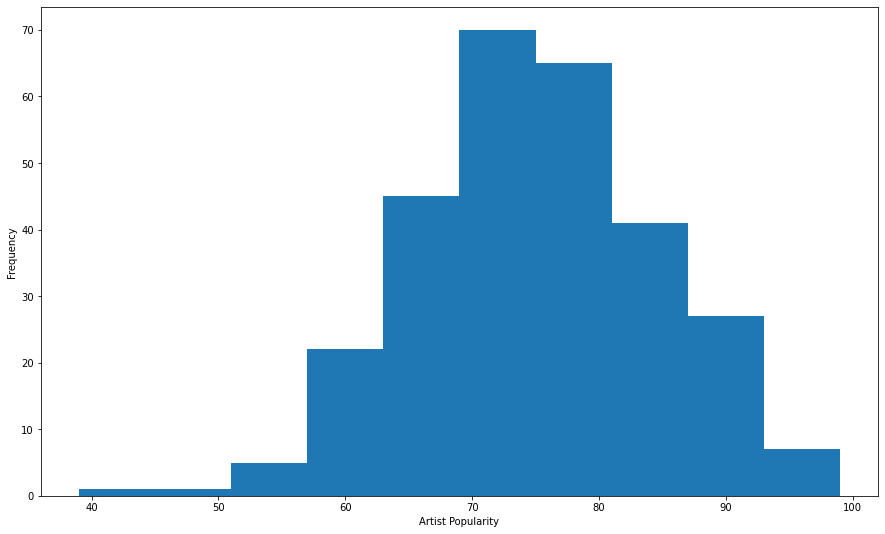

In [48]:
def plot_popularity_per_artist(filtered_dict, save_dir=None):
    pop_per_artist = {k: v["popularity"] for (k, v) in filtered_dict.items()}
    pd.Series(pop_per_artist).plot(kind='hist', figsize=(15, 9), bins=10)
    plt.xlabel("Artist Popularity")
    plt.ylabel("Frequency")
    if save_dir:
        plt.savefig(save_dir)
    plt.show()
    
plot_popularity_per_artist(first_result_spotify_master, "../data/spotify_popularity_per_artist_hist.png")

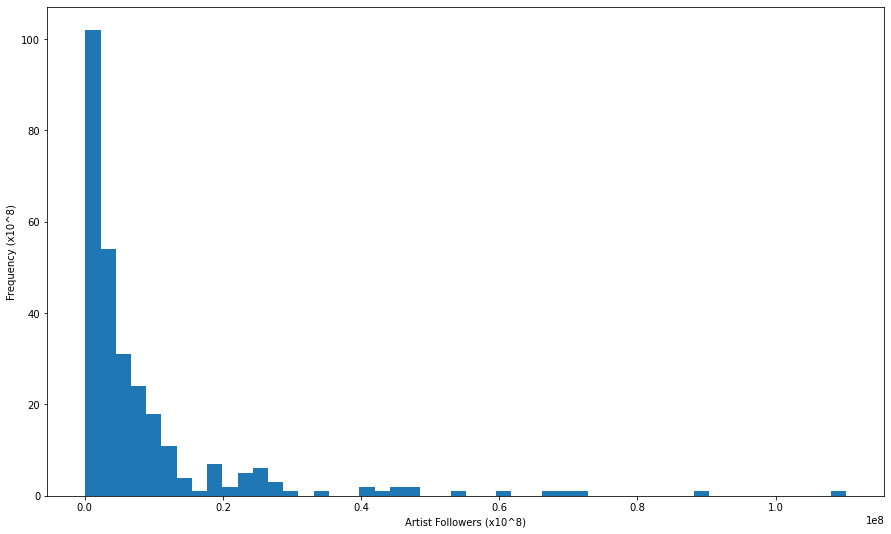

In [49]:
def plot_followers_per_artist(filtered_dict, save_dir=None):
    pop_per_artist = {k: v["followers"]["total"] for (k, v) in filtered_dict.items()}
    pd.Series(pop_per_artist).plot(kind='hist', figsize=(15, 9), bins=50)
    plt.xlabel("Artist Followers (x10^8)")
    plt.ylabel("Frequency (x10^8)")
    if save_dir:
        plt.savefig(save_dir)
    plt.show()
    
plot_followers_per_artist(first_result_spotify_master, "../data/spotify_followers_per_artist_hist.png")

## Could OHE every minimum (derivitive) of this? as a feature

In [50]:

# dot plot, with popularity+followers, img instead of 

# !!! #

In [51]:
pd.DataFrame(first_result_spotify_master).T

,external_urls,followers,genres,href,id,images,name,popularity,type,uri
Robbie Williams,{'spotify': 'https://open.spotify.com/artist/2...,"{'href': None, 'total': 2615812}","[dance rock, europop]",https://api.spotify.com/v1/artists/2HcwFjNelS4...,2HcwFjNelS49kFbfvMxQYw,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Robbie Williams,74,artist,spotify:artist:2HcwFjNelS49kFbfvMxQYw
Imagine Dragons,{'spotify': 'https://open.spotify.com/artist/5...,"{'href': None, 'total': 46089660}","[modern rock, rock]",https://api.spotify.com/v1/artists/53XhwfbYqKC...,53XhwfbYqKCa1cC15pYq2q,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Imagine Dragons,90,artist,spotify:artist:53XhwfbYqKCa1cC15pYq2q
Corinne Bailey Rae,{'spotify': 'https://open.spotify.com/artist/2...,"{'href': None, 'total': 718154}","[british soul, neo mellow, neo soul, pop soul,...",https://api.spotify.com/v1/artists/29WzbAQtDnB...,29WzbAQtDnBJF09es0uddn,"[{'height': 1000, 'url': 'https://i.scdn.co/im...",Corinne Bailey Rae,65,artist,spotify:artist:29WzbAQtDnBJF09es0uddn
Bruce Springsteen,{'spotify': 'https://open.spotify.com/artist/3...,"{'href': None, 'total': 5410308}","[classic rock, heartland rock, mellow gold, pe...",https://api.spotify.com/v1/artists/3eqjTLE0HfP...,3eqjTLE0HfPfh78zjh6TqT,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Bruce Springsteen,78,artist,spotify:artist:3eqjTLE0HfPfh78zjh6TqT
Band of Horses,{'spotify': 'https://open.spotify.com/artist/0...,"{'href': None, 'total': 974222}","[indie rock, modern rock, stomp and holler]",https://api.spotify.com/v1/artists/0OdUWJ0sBjD...,0OdUWJ0sBjDrqHygGUXeCF,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Band of Horses,62,artist,spotify:artist:0OdUWJ0sBjDrqHygGUXeCF
...,...,...,...,...,...,...,...,...,...,...
Jack White,{'spotify': 'https://open.spotify.com/artist/4...,"{'href': None, 'total': 1297950}","[alternative rock, blues rock, garage rock, ga...",https://api.spotify.com/v1/artists/4FZ3j1oH43e...,4FZ3j1oH43e7cukCALsCwf,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Jack White,60,artist,spotify:artist:4FZ3j1oH43e7cukCALsCwf
One Direction,{'spotify': 'https://open.spotify.com/artist/4...,"{'href': None, 'total': 29845004}","[boy band, pop, post-teen pop, talent show]",https://api.spotify.com/v1/artists/4AK6F7OLvEQ...,4AK6F7OLvEQ5QYCBNiQWHq,"[{'height': 1000, 'url': 'https://i.scdn.co/im...",One Direction,87,artist,spotify:artist:4AK6F7OLvEQ5QYCBNiQWHq
J. Cole,{'spotify': 'https://open.spotify.com/artist/6...,"{'href': None, 'total': 19406284}","[conscious hip hop, hip hop, north carolina hi...",https://api.spotify.com/v1/artists/6l3HvQ5sa6m...,6l3HvQ5sa6mXTsMTB19rO5,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",J. Cole,89,artist,spotify:artist:6l3HvQ5sa6mXTsMTB19rO5
Selena Gomez,{'spotify': 'https://open.spotify.com/artist/0...,"{'href': None, 'total': 40560537}","[dance pop, pop, post-teen pop]",https://api.spotify.com/v1/artists/0C8ZW7ezQVs...,0C8ZW7ezQVs4URX5aX7Kqx,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Selena Gomez,88,artist,spotify:artist:0C8ZW7ezQVs4URX5aX7Kqx


# COULD USE POPULARITY OR FOLLOWERS AS FEATURES

# Use artist img for network graph potentially
## Or for Subcommunity (would have to put label above)

# !!! # 

In [52]:
spotify_artist_genres

{'Robbie Williams': ['dance rock', 'europop'],
 'Imagine Dragons': ['modern rock', 'rock'],
 'Corinne Bailey Rae': ['british soul',
  'neo mellow',
  'neo soul',
  'pop soul',
  'soul'],
 'Bruce Springsteen': ['classic rock',
  'heartland rock',
  'mellow gold',
  'permanent wave',
  'rock',
  'singer-songwriter'],
 'Band of Horses': ['indie rock', 'modern rock', 'stomp and holler'],
 'DJ Shadow': ['big beat',
  'downtempo',
  'electronica',
  'hip hop',
  'trip hop',
  'turntablism'],
 'Portishead': ['dark pop', 'electronica', 'laboratorio', 'trip hop'],
 'Lil Wayne': ['hip hop', 'new orleans rap', 'pop rap', 'rap', 'trap'],
 'OutKast': ['atl hip hop',
  'dirty south rap',
  'hip hop',
  'old school atlanta hip hop',
  'pop rap',
  'rap',
  'southern hip hop'],
 'Kanye West': ['chicago rap', 'rap'],
 'M.I.A.': ['dance pop', 'indietronica', 'new rave'],
 'JAY Z': ['east coast hip hop', 'hip hop', 'rap'],
 'Robin Thicke': ['contemporary r&b',
  'dance pop',
  'hip pop',
  'neo soul',
  

# algorithm work (outdated, at least like 3 days old)

### bigclam algorithm taken from https://github.com/RobRomijnders/bigclam

In [111]:
# MinMax method for standardizing edge weights 
def standardize_matrix(G, max_edge = 0):
    if max_edge:
        nx.to_numpy_array(G).divide(max_edge)
    else:
        for i in nx.to_numpy_array(G):
            if (max(i)) > max_edge:
                max_edge = max(i)
        stand_A = []
        for row in nx.to_numpy_array(G):
            stand_row = []
            for edge in row:
                stand_row.append(edge/max_edge)
            stand_A.append(stand_row)
        return np.array(stand_A)
        
# Alt standardizing method, with respect to each node (but weights would become directed as one edge would have two standardized values)
# https://math.stackexchange.com/questions/1136972/how-to-normalize-edges-weight-between-0-and-1

In [ ]:
def sigm(x):
    return np.divide(np.exp(-1.*x),1.-np.exp(-1.*x))

def gradient(F, A, i):
    """Implements equation of
    https://cs.stanford.edu/people/jure/pubs/bigclam-wsdm13.pdf
    
      * i indicates the row under consideration
    
    The many forloops in this function can be optimized, but for
    educational purposes we write them out clearly
    """
    N, C = F.shape

    neighbours = np.where(A[i])
    nneighbours = np.where(1-A[i])

    sum_neigh = np.zeros((C,))
    for nb in neighbours[0]:
        dotproduct = F[nb].dot(F[i])
        sum_neigh += F[nb]*sigm(dotproduct)

    sum_nneigh = np.zeros((C,))
    #Speed up this computation using eq.4
    for nnb in nneighbours[0]:
        sum_nneigh += F[nnb]

    grad = sum_neigh - sum_nneigh
    return grad

def train(A, Att, C, iterations = DEFAULT_ITERATIONS):
    # initialize an F
    N = A.shape[0]
    F = np.random.rand(N,C)
    X = Att
    # weight matrix is (# of attributes, # of groups)
    W = np.random.rand(Att.shape[1], C)
    F_new = np.zeros((N,C))
    W_new = W
    alpha = 0.005
    for n in range(iterations):
        for person in range(N):
            grad = gradient(F, A, person)
            F_new[person] += 0.005*grad + F[person]
        Q = np.divide(1, 1 + np.exp(-F.dot(W.T)))
        F_new += alpha*(X-Q).dot(W_new)
        W_new = alpha*(np.dot((X-Q).T, F) - np.sign(W))
    
        F = np.maximum(.001, F_new) # should this be 0?
    #W = np.maximum(0, W_new)
    delta = (-np.log(1- (1/N)))**.5
    return F>delta, W


# Post Algorithm Functions

# Tests

### Pure Binary Edges

In [ ]:
A = (nx.to_numpy_array(G) >= 1) * 1 # binary adjacency matrix
att = df2.groupby('artistname').agg({'playlistname':lambda x: len(np.unique(np.array(list(x)))) >= 10}) * 1
att = np.array([pd.Series([node for node in G.nodes]).apply(lambda x: dict(zip(att.index, att.playlistname))[x])]).T
t1 = train(A, att, 3)
pred1 = np.argmax(t1[0], 1), t1[1]

### MinMax Standardization

In [ ]:
A = nx.to_numpy_array(G)
A = standardize_matrix(A, )

# attr_mat = np.array([[1 for node in G.nodes()]]).T
# pred = np.argmax(train(A, att, 3), 1)
train(A, att, 3)
np.argmax(train(A, att, 3, 100)[0],1), train(A, att, 3)[1]

# Task list: decipher everything below

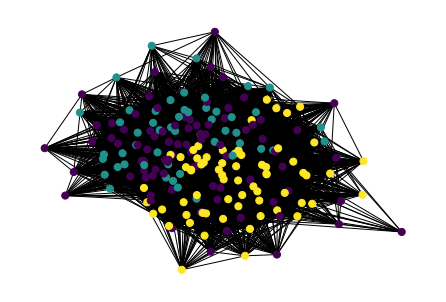

In [45]:
nx.draw(G, node_size=50, node_color = pred)

In [79]:
z = zip(G.nodes(),pred)
for i in z:
    if i[1] == 0:
        v = {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}
    elif i[1] == 1:
        v = {'color': {'r': 0, 'g': 0, 'b': 255, 'a': 0}}
    elif i[1] == 2:
        v = {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0}}
    else:
        v = {'color': {'r': 0, 'g': 0, 'b': 0, 'a': 0}}
    G.nodes[i[0]]['val'] = v
G.nodes(data=True)

NodeDataView({'Maroon 5': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Fall Out Boy': {'val': {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0}}}, 'Beyoncé': {'val': {'color': {'r': 0, 'g': 0, 'b': 255, 'a': 0}}}, 'Pitbull': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Shakira': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Rihanna': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Lorde': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Justin Timberlake': {'val': {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0}}}, 'Mark Ronson': {'val': {'color': {'r': 0, 'g': 0, 'b': 255, 'a': 0}}}, 'Iron & Wine': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Sufjan Stevens': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Daft Punk': {'val': {'color': {'r': 0, 'g': 255, 'b': 0, 'a': 0}}}, 'Phoenix': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, 'a': 0}}}, 'Edward Sharpe & The Magnetic Zeros': {'val': {'color': {'r': 255, 'g': 0, 'b': 0, '

In [ ]:
# 3. Community Split Work

# 	3.1 - Community: (prioritized by ease/importance) 
# 	PREP/GENERATE ANYWHERE FROM 3 - 10 PREDEFINED
# 	Maybe split but each C should have 1 dictionary with all of the following
# 		*  Color Pallette (i'll generate it) including
#             *  Node Color
#             *  Label Color
#             *  Node Border Color
#             *  Edge Color

# 		*  Name of community
# 		* Subname/specific name of community
# 		*  Info (Nodes in community 
# 		* Additional Stats (Helpful features)

# 	3.2 - extract information on each group
# 		- top connected nodes (popular artists in each community)
# 		- avg number of playlists each artist is In
# 		- Avg number of songs per playlist (USE HIST FROM 2)
# 		- Find/Make avg length per artist stat
# - name each community with top 1,2, or 3 genres across 	artists (value count)
# - Other stat plots
